In [1]:
!git clone https://github.com/NVlabs/stylegan3.git

Cloning into 'stylegan3'...
remote: Enumerating objects: 212, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 212 (delta 0), reused 1 (delta 0), pack-reused 207
Receiving objects: 100% (212/212), 4.16 MiB | 7.20 MiB/s, done.
Resolving deltas: 100% (101/101), done.


In [2]:
%cd stylegan3

/content/stylegan3


In [3]:
!nvidia-smi

Fri May 31 07:08:26 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   52C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [4]:
!pip install Ninja -q
!pip install imageio-ffmpeg -q
!pip install youtube-dl -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 30.6 MB/s eta 0:00:00


In [ ]:
#After training the generator network maps random numbers to an image
#We can interpolate between images by interpolating between the numbers.Each image lies within the latent space.StyleGan is based on ProGAN.In style Gan the input is mapped to an intermediate latent space that controls the generator through adaptive instantance normalization.
#StyleGAN3 also referred to as ALias-free gans

In [5]:
import torch
import dnnlib
import legacy
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import os
#!pip install torch==1.13.1

In [6]:
# https://github.com/NVlabs/ffhq-dataset
base_url = 'https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan3/versions/1/files/'
model = "stylegan3-r-ffhq-1024x1024.pkl"
url = base_url + model
print(url)

https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan3/versions/1/files/stylegan3-r-ffhq-1024x1024.pkl


In [7]:
seed = 500
!python gen_images.py --network=$url --trunc=1 --seeds=$seed --outdir=/content/results

Loading networks from "https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan3/versions/1/files/stylegan3-r-ffhq-1024x1024.pkl"...
Generating image for seed 500 (0/1) ...
Setting up PyTorch plugin "bias_act_plugin"... /usr/local/lib/python3.10/dist-packages/torch/utils/cpp_extension.py:1967: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
Done.
Setting up PyTorch plugin "filtered_lrelu_plugin"... /usr/local/lib/python3.10/dist-packages/torch/utils/cpp_extension.py:1967: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
Done.


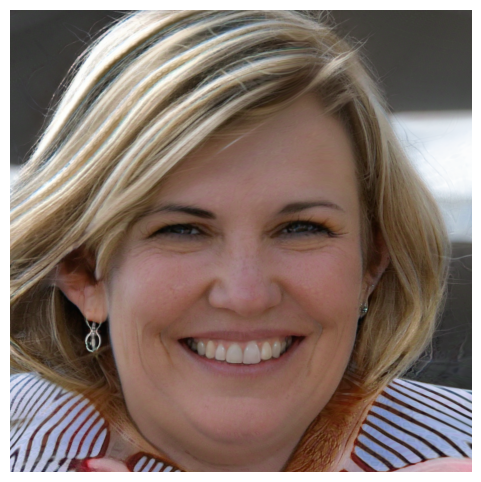

In [8]:
image = Image.open('/content/results/seed%04d.png' % seed)
plt.figure(figsize = (6,6))
plt.axis('off')
plt.imshow(image)

In [9]:
!python gen_images.py --network={url} --outdir=/content/results --seeds=500-505

Loading networks from "https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan3/versions/1/files/stylegan3-r-ffhq-1024x1024.pkl"...
Generating image for seed 500 (0/6) ...
Setting up PyTorch plugin "bias_act_plugin"... /usr/local/lib/python3.10/dist-packages/torch/utils/cpp_extension.py:1967: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
Done.
Setting up PyTorch plugin "filtered_lrelu_plugin"... /usr/local/lib/python3.10/dist-packages/torch/utils/cpp_extension.py:1967: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
Done.
Generating image for seed 501 (1/6) ...
Generating image for seed 502 (2/6) ...
Generating image for seed 503 (3/6) ...
Generating image for seed 504 (4/6) ...
Generating ima

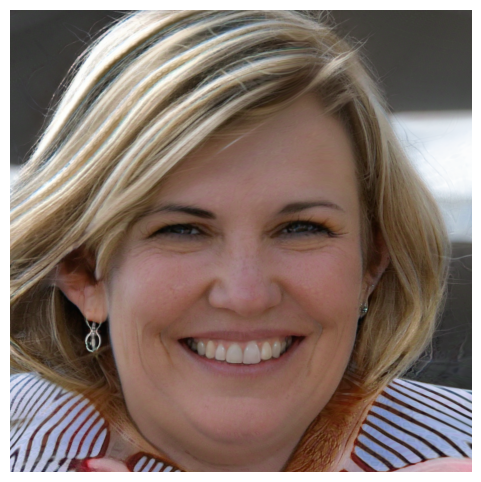

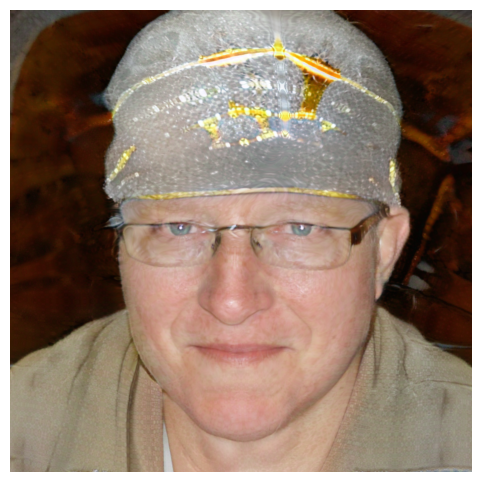

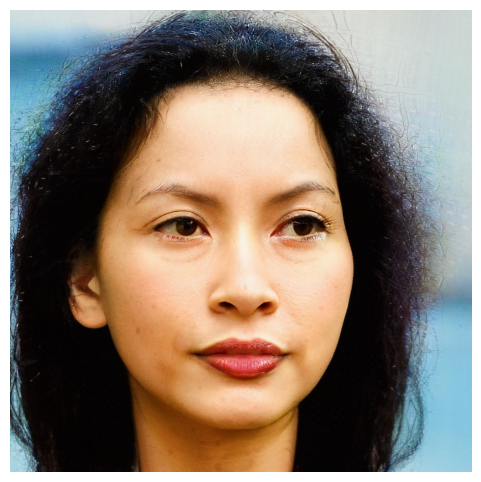

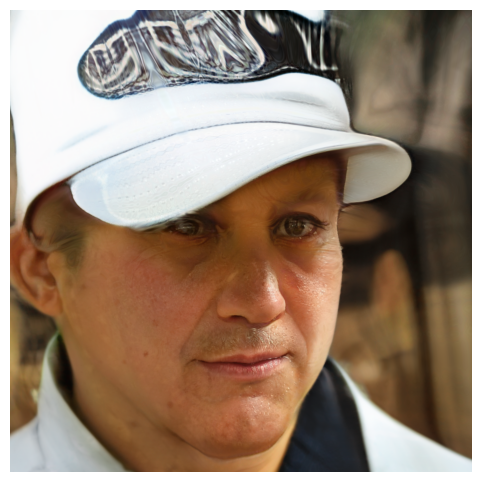

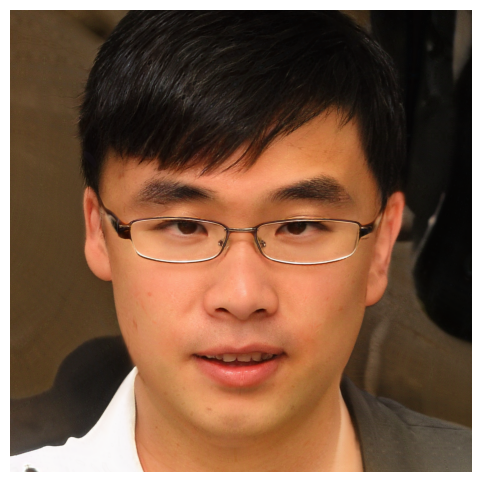

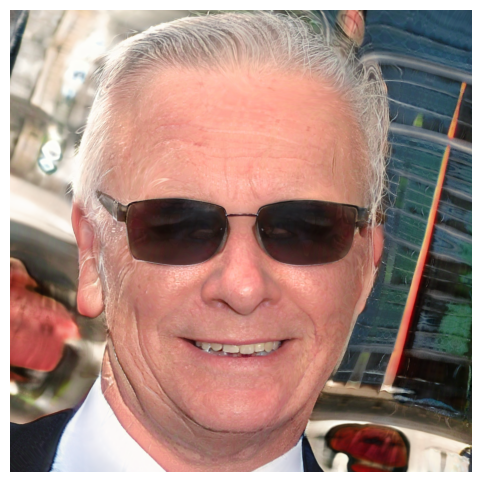

In [10]:
seed_start = 500
seed_end = 505

for n_seed in range(seed_start, seed_end + 1):
  #print(n_seed)
  image = Image.open('/content/results/seed%04d.png' % n_seed)
  plt.figure(figsize = (6,6))
  plt.axis('off')
  plt.imshow(image)

In [11]:
device = torch.device('cuda')
def load_network(url, device):
  with dnnlib.util.open_url(url) as f:
    G = legacy.load_network_pkl(f)['G_ema'].to(device)
  return G

In [12]:
G = load_network(url, device)

In [13]:
#z Noise Vector (latent)

In [14]:
def generate_z(G, seed):
  return np.random.RandomState(seed).randn(1, G.z_dim)

In [16]:
seed = np.random.randint(10000000)
print(seed)
z = generate_z(G, seed)
print(z.shape)

942368
(1, 512)


In [17]:
#The lower the value, the lower the diversity. The higher the value, the greater the diversity

In [18]:
def generate_image(device, G, z, truncation_psi=1.0, noise_mode='const', class_idx=None):
  z = torch.from_numpy(z).to(device)
  label = torch.zeros([1, G.c_dim], device=device)
  img = G(z, label, truncation_psi=truncation_psi, noise_mode=noise_mode)
  # (1, 3, 1024, 1024) -> (1024, 1024, 3)
  img = (img.permute(0,2,3,1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  return Image.fromarray(img[0].cpu().numpy(), 'RGB')

In [19]:
def show_img(image):
  plt.axis('off')
  plt.imshow(image)
  plt.show()

Seed: 800
Setting up PyTorch plugin "bias_act_plugin"... 

/usr/local/lib/python3.10/dist-packages/torch/utils/cpp_extension.py:1967: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(


Done.
Setting up PyTorch plugin "filtered_lrelu_plugin"... 

/usr/local/lib/python3.10/dist-packages/torch/utils/cpp_extension.py:1967: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(


Done.


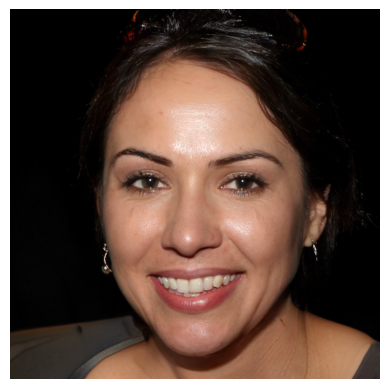

In [20]:
seed = 800
print('Seed:', seed)
z = generate_z(G, seed)
img = generate_image(device, G, z)
show_img(img)

Seed:  800


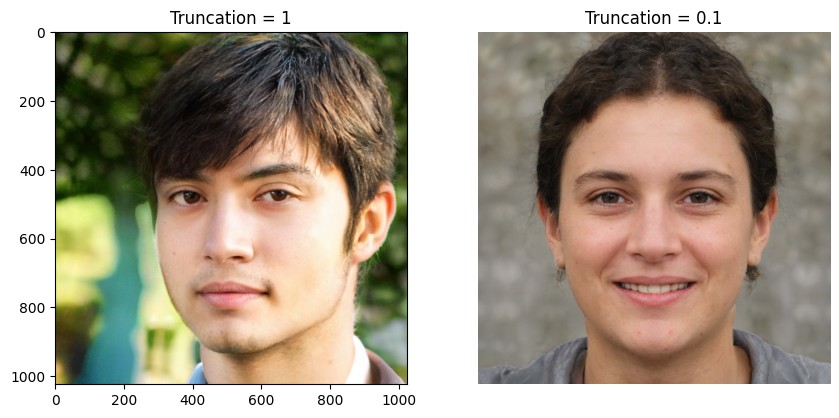

Seed:  800


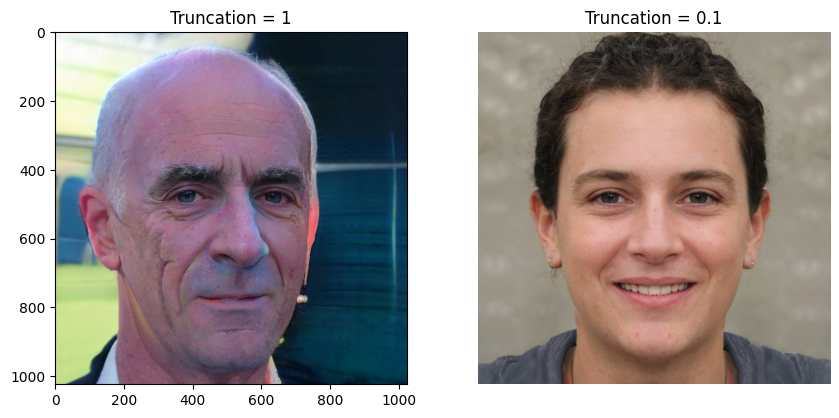

Seed:  800


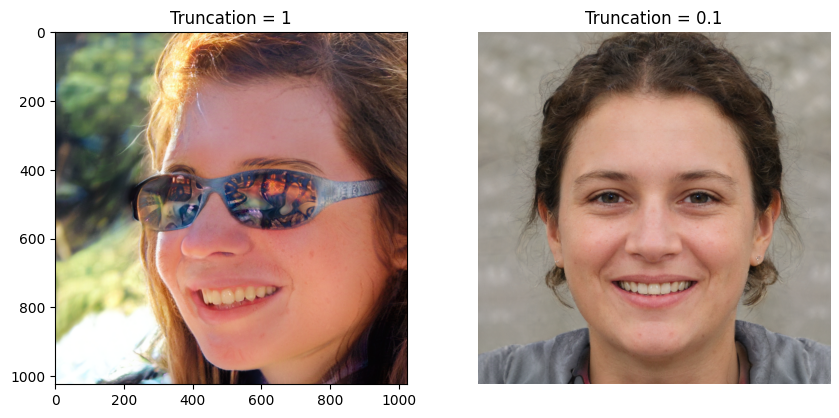

Seed:  800


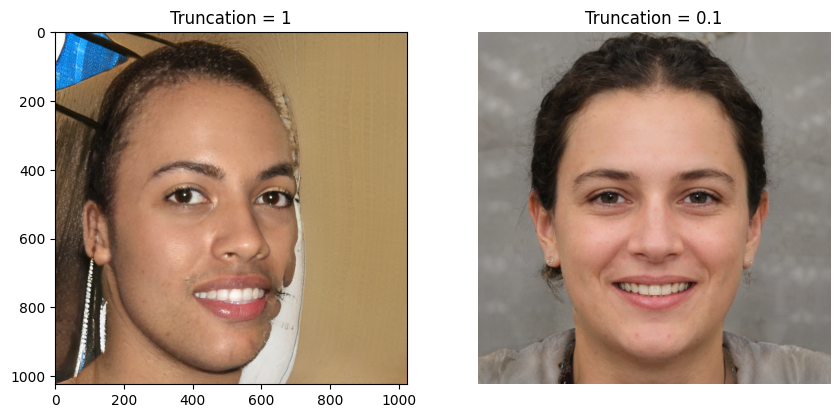

Seed:  800


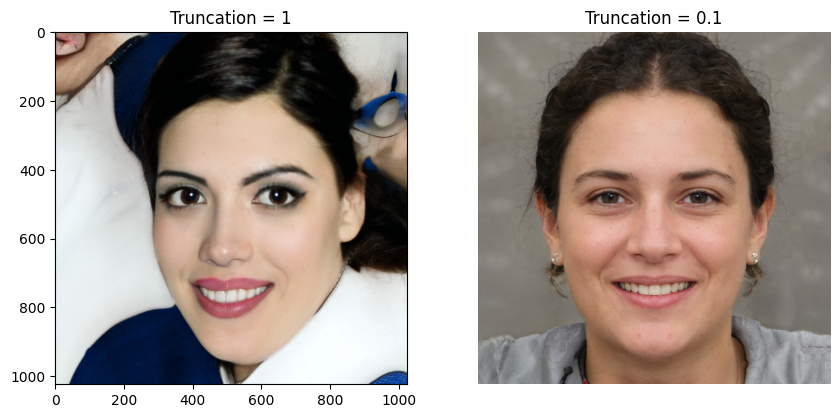

Seed:  800


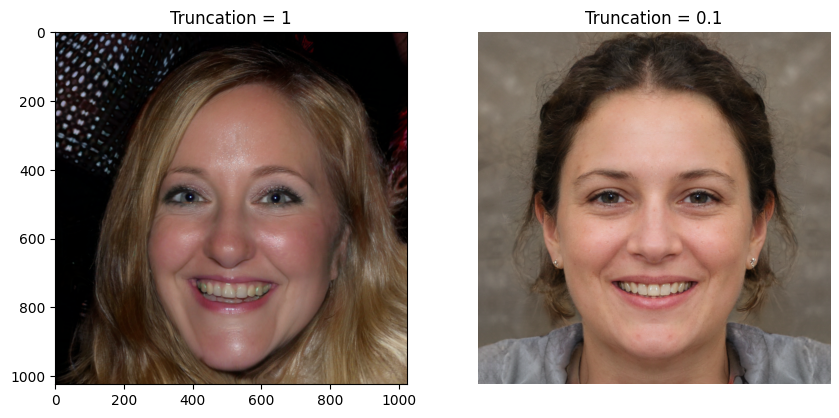

Seed:  800


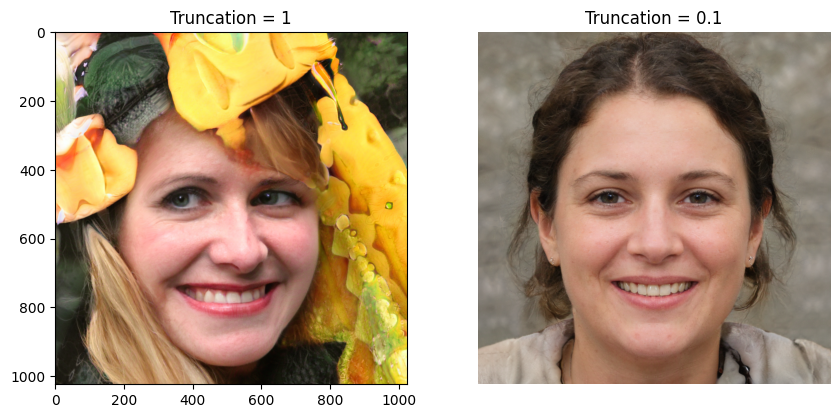

In [21]:
seed_start = 4210
seed_end = 4216
custom_truncation = 0.1

for s in range(seed_start, seed_end+1):
  plt.figure(figsize=(10,6))
  print('Seed: ', seed)
  z = generate_z(G, s)

  image = generate_image(device, G, z)
  image2 = generate_image(device, G, z, custom_truncation)
  plt.subplot(1,2,1)
  plt.title('Truncation = 1')
  plt.imshow(image)

  plt.subplot(1,2,2)
  plt.title('Truncation = {}'.format(custom_truncation))
  plt.imshow(image2)

  plt.axis('off')
  plt.show()

In [ ]:
#Interpolation is Change from one person to another, and see the whole transition (steps). To do that, a Latent vector is needed

In [22]:
from tqdm.notebook import tqdm as log_progress

In [23]:
os.makedirs('/content/interpolation/', exist_ok = True)

In [26]:
seeds = [4210, 4262]
num_vectors = 10

def interpolation(seeds, num_vectors, truncation = 1):
  interpolation_images = []

  idx = 0
  for i in range(len(seeds) - 1):
    latent1 = generate_z(G, seeds[i])
    latent2 = generate_z(G, seeds[i + 1])

    difference = latent2 - latent1
    step = difference / num_vectors
    current = latent1.copy()

    for j in log_progress(range(num_vectors), desc=f'Seed {seeds[i]}'):
      current = current + step
      image = generate_image(device, G, current, truncation)
      interpolation_images.append(image)
      image.save(f'/content/interpolation/frame-{idx}.png')
      idx += 1
  return interpolation_images

In [27]:
interpolation_images = interpolation(seeds, num_vectors, 0.7)

Seed 4210:   0%|          | 0/10 [00:00<?, ?it/s]

In [28]:
from math import ceil
from google.colab.patches import cv2_imshow

def show_images_grid(images, scale=0.25, lines=1):
   w, h = images[0].size
   w = int(w*scale)
   h = int(h*scale)
   height = lines*h
   cols = ceil(len(images) / lines)
   width = cols*w
   grid = Image.new('RGBA', (width,height), 'white')
   for i, img in enumerate(images):
     img = img.resize((w,h), Image.ANTIALIAS)
     grid.paste(img, (w*(i % cols), h*(i // cols)))

   grid = np.array(grid)
   return grid

def show_full_image(image):
  image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
  return cv2_imshow(image)

<ipython-input-28-a4d991b1302e>:13: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


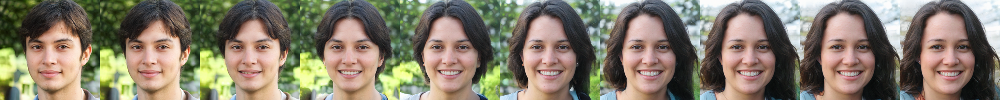

In [29]:
grid_images = show_images_grid(interpolation_images)
show_full_image(grid_images)

In [30]:
import imageio
from IPython.display import Image as displayImage

def create_gif(output_file, images_interpolation):
  with imageio.get_writer(output_file, mode='I', duration=0.15) as writer:

    for i, image in enumerate(images_interpolation):
      frame_anim = np.array(image)
      frame_anim = cv2.resize(frame_anim, (300,300))
      writer.append_data(frame_anim)

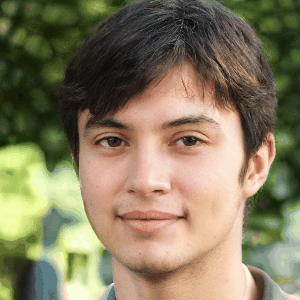

In [34]:
output_file = 'animination.gif'
create_gif(output_file, interpolation_images)
displayImage(open(output_file, 'rb').read())

Seed: 1010


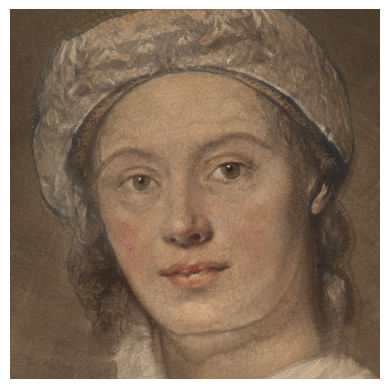

Seed: 1011


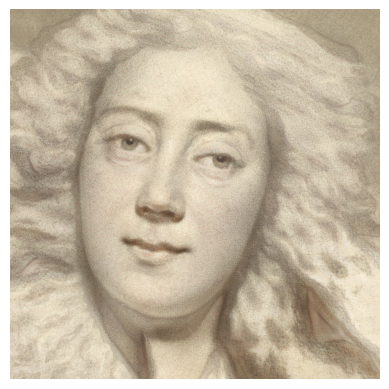

Seed: 1012


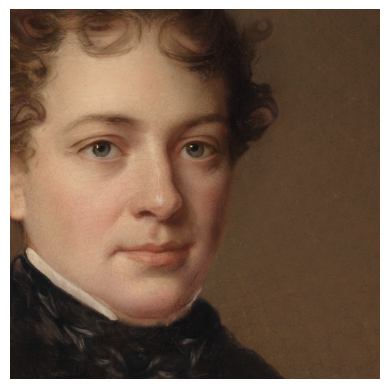

Seed: 1013


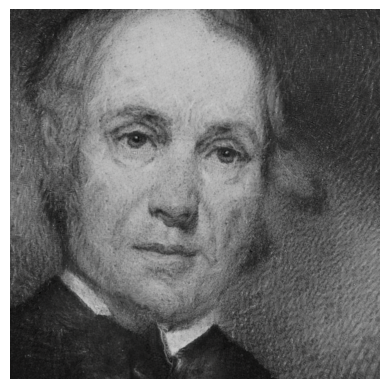

Seed: 1014


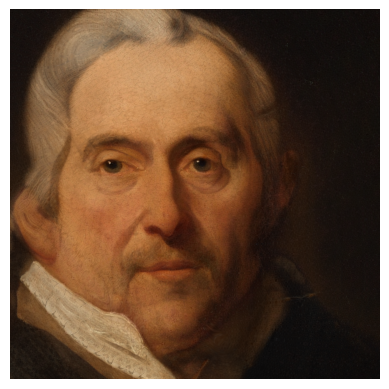

Seed: 1015


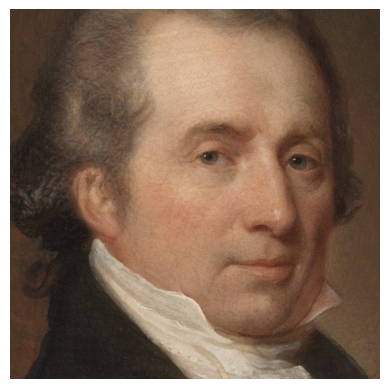

Seed: 1016


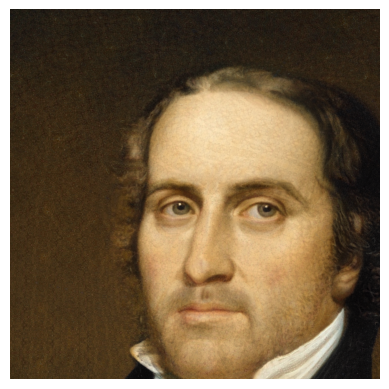

Seed: 1017


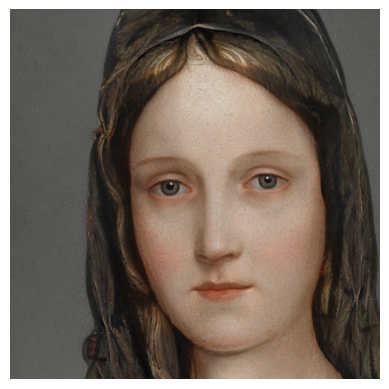

Seed: 1018


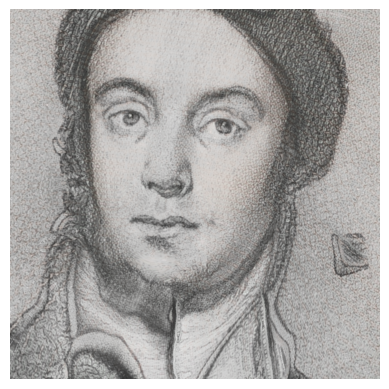

Seed: 1019


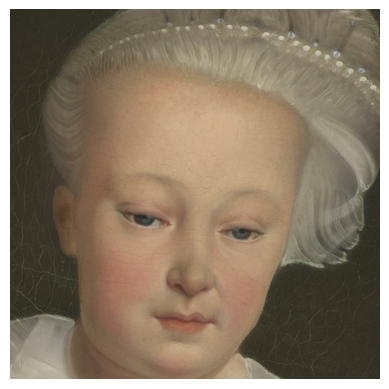

Seed: 1020


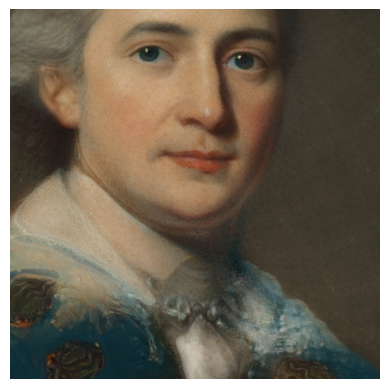

In [36]:
model = 'stylegan3-r-metfacesu-1024x1024.pkl'
url = base_url + model

seed_start = 1010
seed_end = 1020

G = load_network(url, device)

for s in range(seed_start, seed_end+1):
  print(f"Seed: {s}")
  z = generate_z(G, s)
  img = generate_image(device, G, z, 0.7)
  show_img(img)

Seed 1015:   0%|          | 0/10 [00:00<?, ?it/s]

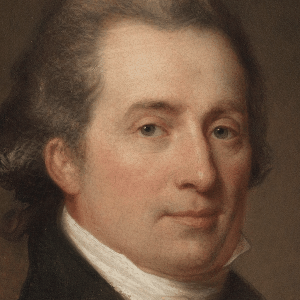

In [37]:
seeds = [1015, 1010]
num_vectors = 10

interpolation_images = interpolation(seeds, num_vectors, 0.5)

output_file = 'animation_metfaces.gif'
create_gif(output_file, interpolation_images)
displayImage(open(output_file,'rb').read())

Seed: 4210


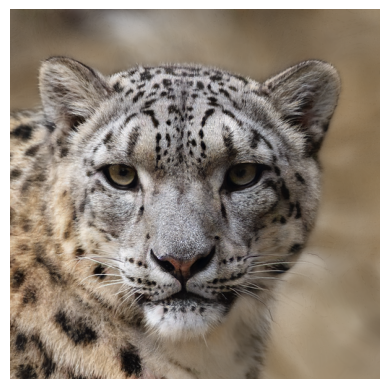

Seed: 4211


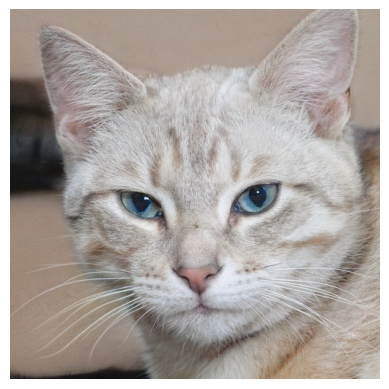

Seed: 4212


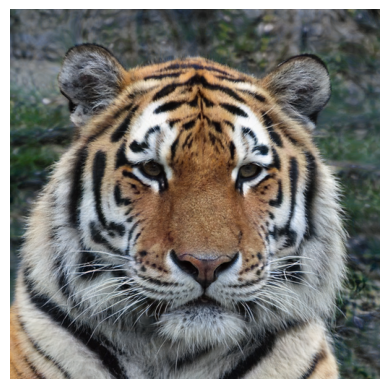

Seed: 4213


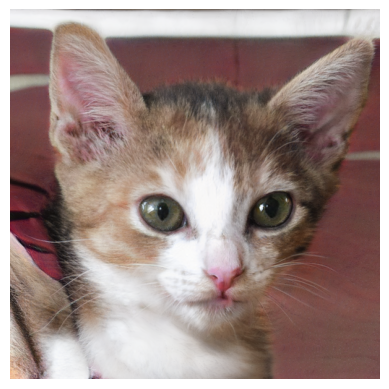

Seed: 4214


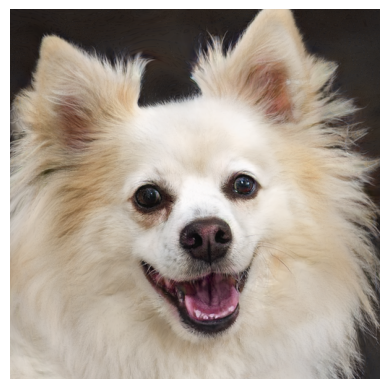

Seed: 4215


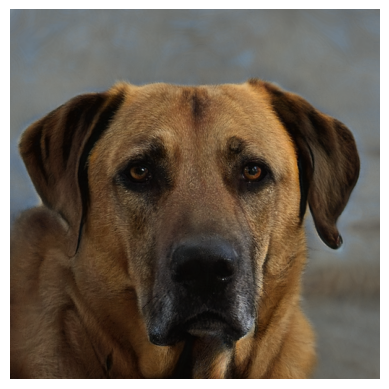

Seed: 4216


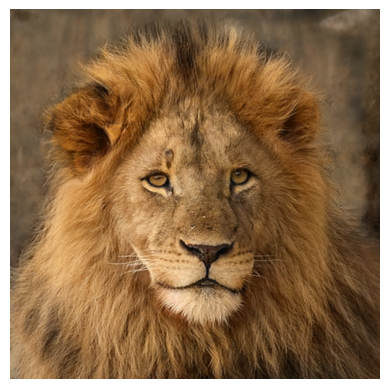

Seed: 4217


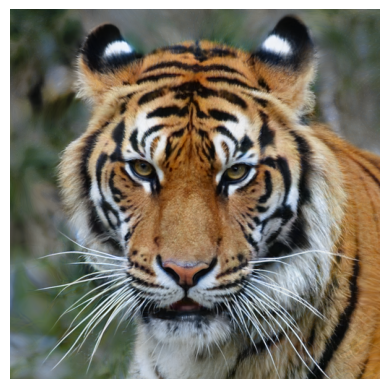

Seed: 4218


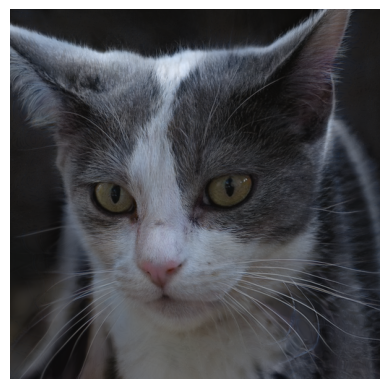

Seed: 4219


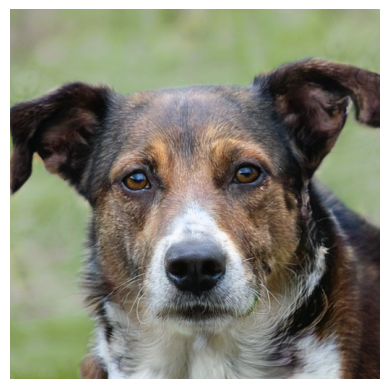

Seed: 4220


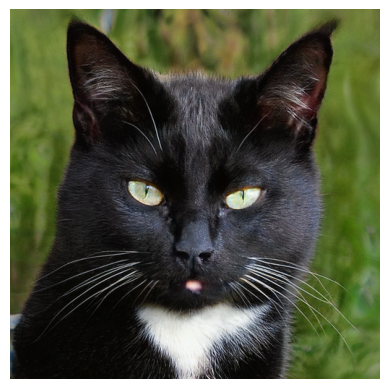

In [38]:
model = 'stylegan3-t-afhqv2-512x512.pkl'
url = base_url + model

seed_start = 4210
seed_end = 4220

G = load_network(url, device)

for s in range(seed_start, seed_end+1):
  print(f"Seed: {s}")
  z = generate_z(G, s)
  img = generate_image(device, G, z, 0.7)
  show_img(img)

Seed 4220:   0%|          | 0/20 [00:00<?, ?it/s]

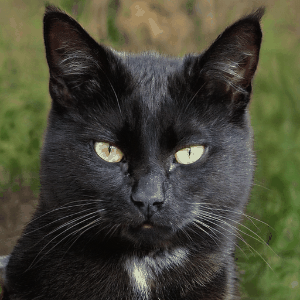

In [40]:
seeds = [4220, 4211]
num_vectors = 20

interpolation_images = interpolation(seeds, num_vectors, 0.5)

output_file = 'animation_afhqv2.gif'
create_gif(output_file, interpolation_images)
displayImage(open(output_file,'rb').read())

In [ ]:
#sees represent the random numbers.If u keep the same seed same images will be generated